# Reto | TCA Software Solutions
## Análisis Exploratorio
Pamela Cantú Rodríguez | A01285128   
Ana Sofía Ugalde Jiménez | A01702639   
Leslie Ramos Gutiérrez | A01562461   
Eder Gersahí Martínez León | A00831442   
Fernanda Alanis Montfort | A01721959  

### Información a usar

Se utilizó una única tabla como fuente principal de análisis, ya que la columna "h_tfa_total" proporciona los ingresos por reservación. Dado que todas las columnas ya estaban codificadas, no fue necesario realizar uniones (merges) con otras tablas ni codificarlas. Sin embargo, las tablas clave de la base de datos serán cruciales para la fase de interpretación de los resultados.

### Data Wrangler

El dataset original consistía en 49 columnas y 203,002 observaciones. A continuación se muestra una tabla con el nombre de cada columna y su tipo de dato:

| #  | Column                    | Dtype      |
|----|---------------------------|------------|
| 0  | ID_Reserva                | int64      |
| 1  | Fecha_hoy                 | object     |
| 2  | h_res_fec                 | int64      |
| 3  | h_res_fec_ok              | object     |
| 4  | h_res_fec_okt             | object     |
| 5  | h_num_per                 | int64      |
| 6  | aa_h_num_per              | int64      |
| 7  | h_num_adu                 | int64      |
| 8  | aa_h_num_adu              | int64      |
| 9  | h_num_men                 | int64      |
| 10 | aa_h_num_men              | int64      |
| 11 | h_num_noc                 | int64      |
| 12 | aa_h_num_noc              | int64      |
| 13 | h_tot_hab                 | int64      |
| 14 | aa_h_tot_hab              | int64      |
| 15 | ID_Programa               | int64      |
| 16 | ID_Paquete                | int64      |
| 17 | ID_Segmento_Comp          | int64      |
| 18 | ID_Agencia                | int64      |
| 19 | ID_empresa                | int64      |
| 20 | ID_Tipo_Habitacion        | int64      |
| 21 | ID_canal                  | int64      |
| 22 | h_fec_lld                 | object     |
| 23 | h_fec_lld_ok              | object     |
| 24 | h_fec_lld_okt             | object     |
| 25 | h_fec_reg                 | object     |
| 26 | h_fec_reg_ok              | object     |
| 27 | h_fec_reg_okt             | object     |
| 28 | h_fec_sda                 | object     |
| 29 | h_fec_sda_ok              | object     |
| 30 | h_fec_sda_okt             | object     |
| 31 | ID_Pais_Origen            | int64      |
| 32 | Cliente_Disp              | int64      |
| 33 | aa_Cliente_Disp           | int64      |
| 34 | Reservacion               | int64      |
| 35 | aa_Reservacion            | int64      |
| 36 | ID_estatus_reservaciones  | int64      |
| 37 | h_can_res                 | object     |
| 38 | h_cod_reserva             | object     |
| 39 | h_edo                     | object     |
| 40 | h_codigop                 | object     |
| 41 | h_correo_e                | float64    |
| 42 | h_nom                     | float64    |
| 43 | h_tfa_total               | float64    |
| 44 | aa_h_tfa_total            | float64    |
| 45 | moneda_cve                | int64      |
| 46 | h_ult_cam_fec             | object     |
| 47 | h_ult_cam_fec_ok          | object     |
| 48 | h_ult_cam_fec_okt         | object     |

* Uso de Data Wrangler   

Se utilizó Data Wrangler para realizar la depuración inicial de los datos. Esta herramienta facilitó la limpieza de columnas irrelevantes, la transformación de tipos de datos y la eliminación de observaciones atípicas de forma visual y estructurada.


* Eliminación de columnas innecesarias   

Se eliminaron todas las columnas que comenzaban con el prefijo aa, ya que correspondían a datos del año anterior que no eran necesarios para el análisis. También se eliminaron columnas duplicadas, como fechas repetidas en diferentes formatos (original, ok, okt). Adicionalmente, se eliminaron otras columnas irrelevantes como h_nom, h_correo_e (estaba vacía), moneda_cve (solo contaba con un valor categórico), y ID_Reserva, entre otras.   

* Conversión de tipos de datos

Las columnas de fecha h_fec_lld_ok y h_fec_sda_ok fueron convertidas de tipo object a datetime64[ns]. Solo se conservaron estas dos columnas, ya que representan la fecha de llegada y de salida, respectivamente.   

* Filtrado por ID de programa   

Se eliminaron las filas cuyo valor de ID_Programa era igual a 0, ya que representaban menos del 0.5% del total de datos y no aportaban información valiosa. Después, se eliminó la columna.


* Eliminación de outliers por número de noches

La columna h_num_noc (número de noches por reservación) contenía valores extremadamente altos (hasta más de 600). Usando la fórmula para detección de outliers, se decidió conservar únicamente las observaciones con hasta 8 noches.   

* Revisión del país de origen

Se observó que en la columna ID_Pais_Origen existía pocas filas  con un valor diferente a 157. Al no representar una cantidad significativa ni aportar diversidad al análisis, se eliminaron dichas filas y posteriormente la columna fue eliminada.    

* Eliminación de observaciones no válidas   

Se eliminaron todas las filas en las que el número de noches, habitaciones, personas o la tarifa (h_tfa_total) fuera igual a 0, ya que no representan reservaciones reales. Asimismo, se eliminaron las filas con tarifas negativas.    

* Tarifas extremadamente altas    

Se detectaron tarifas superiores a 23,000, consideradas como outliers. Estas observaciones fueron eliminadas al no representar un gran cantidad del conjunto de datos.   

* Limpieza de duplicados

Las celdas que contenían únicamente espacios fueron reemplazadas por valores nulos. Luego, se eliminaron duplicados usando como criterio el código de reservación (h_cod_reserva), ya que era posible encontrar registros con los mismos valores en otras columnas.        

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_error, r2_score


In [2]:
#Cargar el dataset
df=pd.read_csv("iar_Reservaciones.csv")

C:\Users\gersa\AppData\Local\Temp\ipykernel_30560\503450624.py:2: DtypeWarning: Columns (22,28) have mixed types. Specify dtype option on import or set low_memory=False.
  df=pd.read_csv("iar_Reservaciones.csv")


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 203002 entries, 0 to 203001
Data columns (total 49 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID_Reserva                203002 non-null  int64  
 1   Fecha_hoy                 203002 non-null  object 
 2   h_res_fec                 203002 non-null  int64  
 3   h_res_fec_ok              203002 non-null  object 
 4   h_res_fec_okt             203002 non-null  object 
 5   h_num_per                 203002 non-null  int64  
 6   aa_h_num_per              203002 non-null  int64  
 7   h_num_adu                 203002 non-null  int64  
 8   aa_h_num_adu              203002 non-null  int64  
 9   h_num_men                 203002 non-null  int64  
 10  aa_h_num_men              203002 non-null  int64  
 11  h_num_noc                 203002 non-null  int64  
 12  aa_h_num_noc              203002 non-null  int64  
 13  h_tot_hab                 203002 non-null  i

In [4]:
# Limpieza básica de datos realizada con Data Wrangler)
def clean_data(data):
    # Eliminar columnas innecesarias
    data = data.drop(columns=['aa_h_num_per', 'h_res_fec', 'h_res_fec_okt', 'aa_h_num_adu', 'aa_h_num_men', 
                              'aa_h_num_noc', 'aa_h_tot_hab', 'h_fec_lld_okt', 'h_fec_lld', 'h_fec_reg', 
                              'h_fec_reg_okt', 'h_fec_sda', 'h_fec_sda_okt', 'h_nom', 'h_correo_e', 
                              'aa_h_tfa_total', 'moneda_cve', 'h_ult_cam_fec', 'h_ult_cam_fec_okt',
                              'ID_Reserva', 'aa_Cliente_Disp', 'aa_Reservacion', 'Fecha_hoy', 'h_fec_reg_ok',
                              'h_res_fec_ok','h_ult_cam_fec_ok'])
    # Cambiar las fechas de object a datetime64[ns]
    data = data.astype({'h_fec_lld_ok': 'datetime64[ns]', 'h_fec_sda_ok': 'datetime64[ns]'})
    # Filtrar Filas con ID Programa = 0
    data = data[~(data['ID_Programa'] == 0)]
    data = data.drop('ID_Programa', axis=1)
    # Quitar outliers de número de noches
    data = data[data['h_num_noc'] <= 8]
    # Filtrar filas con ID_Pais_Origen = 157
    data = data[data['ID_Pais_Origen'] == 157]
    # Quitar columna 'ID_Pais_Origen'
    data = data.drop(columns=['ID_Pais_Origen'])
    # Filtrar filas con num de habitaciones, de noches, tarifa y personas = 0
    data = data[~((data['h_num_per'] == 0) & (data['h_num_noc'] == 0) & (data['h_tot_hab'] == 0) & (data['h_tfa_total'] == 0))]
    # Quitar valores negativos de la columna de tarifa
    data = data[data['h_tfa_total'] >= 0]
    # Quitar outliers de la columna de tarifa
    data = data[data['h_tfa_total'] <= 23000]
    return data

data_clean = clean_data(df.copy())
data_clean.head()

,h_num_per,h_num_adu,h_num_men,h_num_noc,h_tot_hab,ID_Paquete,ID_Segmento_Comp,ID_Agencia,ID_empresa,ID_Tipo_Habitacion,...,h_fec_lld_ok,h_fec_sda_ok,Cliente_Disp,Reservacion,ID_estatus_reservaciones,h_can_res,h_cod_reserva,h_edo,h_codigop,h_tfa_total
0,2,2,0,3,1,1,14,112,1,25,...,2019-11-07,2019-11-10,2,1,9,09,,EMX,01500,2659.98
1,4,4,0,4,1,2,14,112,1,25,...,2019-12-01,2019-12-05,4,1,9,09,,EGT,023541,1764.00
2,2,2,0,4,1,1,14,112,1,23,...,2019-12-01,2019-12-05,2,1,9,09,,EMC,59800,2660.04
3,4,3,0,3,1,2,14,112,1,24,...,2019-12-08,2019-12-11,3,1,9,09,,EGT,37219,1995.03
4,2,2,0,4,1,1,5,14,1,4,...,2019-12-08,2019-12-12,2,1,9,12,74101652-3_2394,EMX,15300,13369.92


In [5]:
data_clean.columns

Index(['h_num_per', 'h_num_adu', 'h_num_men', 'h_num_noc', 'h_tot_hab',
       'ID_Paquete', 'ID_Segmento_Comp', 'ID_Agencia', 'ID_empresa',
       'ID_Tipo_Habitacion', 'ID_canal', 'h_fec_lld_ok', 'h_fec_sda_ok',
       'Cliente_Disp', 'Reservacion', 'ID_estatus_reservaciones', 'h_can_res',
       'h_cod_reserva', 'h_edo', 'h_codigop', 'h_tfa_total'],
      dtype='object')

In [6]:
data_clean.shape

(98401, 21)

In [7]:
data_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 98401 entries, 0 to 102198
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   h_num_per                 98401 non-null  int64         
 1   h_num_adu                 98401 non-null  int64         
 2   h_num_men                 98401 non-null  int64         
 3   h_num_noc                 98401 non-null  int64         
 4   h_tot_hab                 98401 non-null  int64         
 5   ID_Paquete                98401 non-null  int64         
 6   ID_Segmento_Comp          98401 non-null  int64         
 7   ID_Agencia                98401 non-null  int64         
 8   ID_empresa                98401 non-null  int64         
 9   ID_Tipo_Habitacion        98401 non-null  int64         
 10  ID_canal                  98401 non-null  int64         
 11  h_fec_lld_ok              98401 non-null  datetime64[ns]
 12  h_fec_sda_ok     

In [8]:
data_clean.head(10)

,h_num_per,h_num_adu,h_num_men,h_num_noc,h_tot_hab,ID_Paquete,ID_Segmento_Comp,ID_Agencia,ID_empresa,ID_Tipo_Habitacion,...,h_fec_lld_ok,h_fec_sda_ok,Cliente_Disp,Reservacion,ID_estatus_reservaciones,h_can_res,h_cod_reserva,h_edo,h_codigop,h_tfa_total
0,2,2,0,3,1,1,14,112,1,25,...,2019-11-07,2019-11-10,2,1,9,09,,EMX,01500,2659.98
1,4,4,0,4,1,2,14,112,1,25,...,2019-12-01,2019-12-05,4,1,9,09,,EGT,023541,1764.00
2,2,2,0,4,1,1,14,112,1,23,...,2019-12-01,2019-12-05,2,1,9,09,,EMC,59800,2660.04
3,4,3,0,3,1,2,14,112,1,24,...,2019-12-08,2019-12-11,3,1,9,09,,EGT,37219,1995.03
4,2,2,0,4,1,1,5,14,1,4,...,2019-12-08,2019-12-12,2,1,9,12,74101652-3_2394,EMX,15300,13369.92
5,6,6,0,4,1,1,14,112,1,24,...,2019-12-01,2019-12-05,6,1,9,11,,EGT,(443) 121,2660.04
6,2,2,0,3,1,1,14,112,1,25,...,2019-08-22,2019-08-25,2,1,2,09,,EGR,,3331.98
7,2,2,0,2,1,1,5,14,1,4,...,2019-08-23,2019-08-25,2,1,9,00,73605555-1,EMC,58410,8809.92
8,3,2,0,4,1,2,14,112,1,26,...,2019-08-25,2019-08-29,2,1,9,09,,EGR,01245,2548.00
9,2,2,0,4,1,2,14,112,1,27,...,2019-08-25,2019-08-29,2,1,9,09,,EMC,58080,2548.00


## Quitar duplicados

In [9]:
#Reemplazar las celdas con espacios por NaN
data_clean['h_cod_reserva'] = data_clean['h_cod_reserva'].replace(r'^\s+.*', np.nan, regex=True)


In [10]:
# Quitar valores duplicados ignorando lo valores nulos
data_clean= data_clean[(~data_clean['h_cod_reserva'].duplicated()) | data_clean['h_cod_reserva'].isna()]

In [11]:
data_clean.shape

(93716, 21)

## Inputar datos

In [12]:
## inputar datos
data_clean[data_clean['h_tfa_total']==0]

,h_num_per,h_num_adu,h_num_men,h_num_noc,h_tot_hab,ID_Paquete,ID_Segmento_Comp,ID_Agencia,ID_empresa,ID_Tipo_Habitacion,...,h_fec_lld_ok,h_fec_sda_ok,Cliente_Disp,Reservacion,ID_estatus_reservaciones,h_can_res,h_cod_reserva,h_edo,h_codigop,h_tfa_total
48,2,2,0,3,1,1,16,23,1,4,...,2019-09-26,2019-09-29,2,1,2,DI,NaN,EMC,,0.0
117,2,2,0,2,1,1,1,32,1,7,...,2019-12-06,2019-12-08,2,1,9,00,NaN,EMX,01180,0.0
125,2,2,0,2,1,1,1,32,1,13,...,2019-12-02,2019-12-04,2,1,9,00,NaN,EMC,0,0.0
127,2,2,0,4,1,2,1,69,1,17,...,2019-12-02,2019-12-06,2,1,9,03,NaN,EQE,76120,0.0
194,2,2,0,2,1,1,1,32,1,6,...,2019-12-06,2019-12-08,2,1,9,00,NaN,EMC,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101931,2,2,0,2,1,2,17,99,1,19,...,2020-11-13,2020-11-15,2,1,5,03,NaN,EGR,,0.0
101932,2,2,0,2,1,2,17,99,1,19,...,2020-11-13,2020-11-15,2,1,5,03,NaN,EGR,,0.0
101933,2,2,0,2,1,2,17,99,1,19,...,2020-11-13,2020-11-15,2,1,5,03,NaN,EGR,,0.0
101934,2,2,0,2,1,2,17,99,1,19,...,2020-11-13,2020-11-15,2,1,5,03,NaN,EGR,,0.0


In [13]:
df2=data_clean.copy()

In [14]:
date_columns = df2.select_dtypes(include=['datetime64[ns]']).columns
other_columns = df2.select_dtypes(include=['object']).columns

In [15]:
le = LabelEncoder()
for i in other_columns:
  df2[i] = le.fit_transform(df2[i])

In [16]:
filas_inputar=df2[df2['h_tfa_total']==0]
filas_inputar=filas_inputar.drop('h_tfa_total', axis=1)
df2=df2[df2['h_tfa_total']!=0]

In [17]:
X = df2.drop('h_tfa_total', axis=1)
y = df2['h_tfa_total']

In [18]:
for i in date_columns:
  X[i]=X[i].astype('int64')/1e9
  filas_inputar[i]=filas_inputar[i].astype('int64')/1e9

In [19]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [20]:
reg = RandomForestRegressor(n_estimators=100, random_state=42)
reg.fit(X_train, y_train)

y_pred = reg.predict(X_test)
print("MSE:", mean_squared_error(y_test, y_pred))
print("R² Score:", r2_score(y_test, y_pred))

MSE: 1199702.9231214465
R² Score: 0.9410020818164816


In [21]:
filas_inputar

,h_num_per,h_num_adu,h_num_men,h_num_noc,h_tot_hab,ID_Paquete,ID_Segmento_Comp,ID_Agencia,ID_empresa,ID_Tipo_Habitacion,ID_canal,h_fec_lld_ok,h_fec_sda_ok,Cliente_Disp,Reservacion,ID_estatus_reservaciones,h_can_res,h_cod_reserva,h_edo,h_codigop
48,2,2,0,3,1,1,16,23,1,4,0,1.569456e+09,1.569715e+09,2,1,2,13,31047,75,0
117,2,2,0,2,1,1,1,32,1,7,1,1.575590e+09,1.575763e+09,2,1,9,0,31047,85,290
125,2,2,0,2,1,1,1,32,1,13,1,1.575245e+09,1.575418e+09,2,1,9,0,31047,75,241
127,2,2,0,4,1,2,1,69,1,17,4,1.575245e+09,1.575590e+09,2,1,9,3,31047,113,8051
194,2,2,0,2,1,1,1,32,1,6,1,1.575590e+09,1.575763e+09,2,1,9,0,31047,75,241
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101931,2,2,0,2,1,2,17,99,1,19,4,1.605226e+09,1.605398e+09,2,1,5,3,31047,52,0
101932,2,2,0,2,1,2,17,99,1,19,4,1.605226e+09,1.605398e+09,2,1,5,3,31047,52,0
101933,2,2,0,2,1,2,17,99,1,19,4,1.605226e+09,1.605398e+09,2,1,5,3,31047,52,0
101934,2,2,0,2,1,2,17,99,1,19,4,1.605226e+09,1.605398e+09,2,1,5,3,31047,52,0


In [22]:
input_pred=reg.predict(filas_inputar)
filas_inputar['h_tfa_total'] = input_pred

In [23]:
for i in date_columns:
    filas_inputar[i] = pd.to_datetime(filas_inputar[i], unit='s')

In [24]:
filas_inputar

,h_num_per,h_num_adu,h_num_men,h_num_noc,h_tot_hab,ID_Paquete,ID_Segmento_Comp,ID_Agencia,ID_empresa,ID_Tipo_Habitacion,...,h_fec_lld_ok,h_fec_sda_ok,Cliente_Disp,Reservacion,ID_estatus_reservaciones,h_can_res,h_cod_reserva,h_edo,h_codigop,h_tfa_total
48,2,2,0,3,1,1,16,23,1,4,...,2019-09-26,2019-09-29,2,1,2,13,31047,75,0,11302.598400
117,2,2,0,2,1,1,1,32,1,7,...,2019-12-06,2019-12-08,2,1,9,0,31047,85,290,804.680000
125,2,2,0,2,1,1,1,32,1,13,...,2019-12-02,2019-12-04,2,1,9,0,31047,75,241,3789.419200
127,2,2,0,4,1,2,1,69,1,17,...,2019-12-02,2019-12-06,2,1,9,3,31047,113,8051,7088.780700
194,2,2,0,2,1,1,1,32,1,6,...,2019-12-06,2019-12-08,2,1,9,0,31047,75,241,804.680000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101931,2,2,0,2,1,2,17,99,1,19,...,2020-11-13,2020-11-15,2,1,5,3,31047,52,0,5334.545027
101932,2,2,0,2,1,2,17,99,1,19,...,2020-11-13,2020-11-15,2,1,5,3,31047,52,0,5334.545027
101933,2,2,0,2,1,2,17,99,1,19,...,2020-11-13,2020-11-15,2,1,5,3,31047,52,0,5334.545027
101934,2,2,0,2,1,2,17,99,1,19,...,2020-11-13,2020-11-15,2,1,5,3,31047,52,0,5334.545027


In [25]:
df_unido = pd.concat([df2, filas_inputar], ignore_index=True)

## Elección de variables



In [26]:
X = df_unido.drop('h_tfa_total', axis=1)
y = df_unido['h_tfa_total']

In [27]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 93716 entries, 0 to 93715
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   h_num_per                 93716 non-null  int64         
 1   h_num_adu                 93716 non-null  int64         
 2   h_num_men                 93716 non-null  int64         
 3   h_num_noc                 93716 non-null  int64         
 4   h_tot_hab                 93716 non-null  int64         
 5   ID_Paquete                93716 non-null  int64         
 6   ID_Segmento_Comp          93716 non-null  int64         
 7   ID_Agencia                93716 non-null  int64         
 8   ID_empresa                93716 non-null  int64         
 9   ID_Tipo_Habitacion        93716 non-null  int64         
 10  ID_canal                  93716 non-null  int64         
 11  h_fec_lld_ok              93716 non-null  datetime64[ns]
 12  h_fec_sda_ok      

In [28]:
# for i in date_columns:
#     X[i] = pd.to_datetime(X[i], errors='coerce')


In [29]:
date_columns    

Index(['h_fec_lld_ok', 'h_fec_sda_ok'], dtype='object')

In [30]:
for i in date_columns:
  X[i]=pd.to_datetime(X[i])
  X[i]=X[i].astype('int64')/1e9

In [31]:
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X, y)

# Obtener importancia de variables
importancias = pd.Series(model.feature_importances_, index=X.columns)

# Ordenarlas de mayor a menor
importancias = importancias.sort_values(ascending=False)

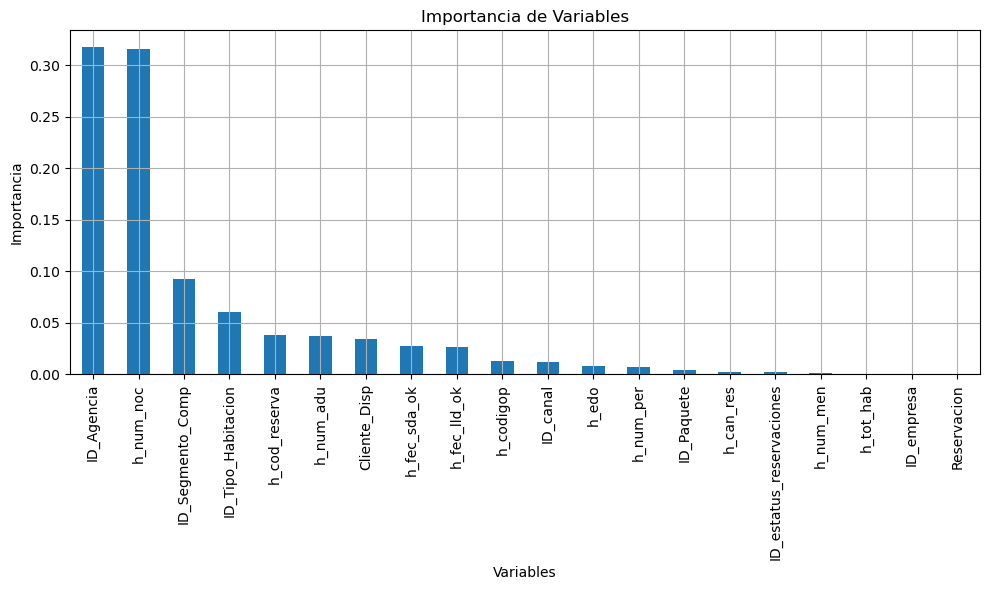

In [32]:
import matplotlib.pyplot as plt

# Graficar
plt.figure(figsize=(10,6))   
importancias.plot(kind='bar')
plt.title('Importancia de Variables')
plt.ylabel('Importancia')
plt.xlabel('Variables')
plt.xticks(rotation=90)     
plt.grid(True)
plt.tight_layout()          
plt.show()

## Gráficos

In [33]:
columns_with_id = [col for col in df_unido.columns if 'ID' in col]

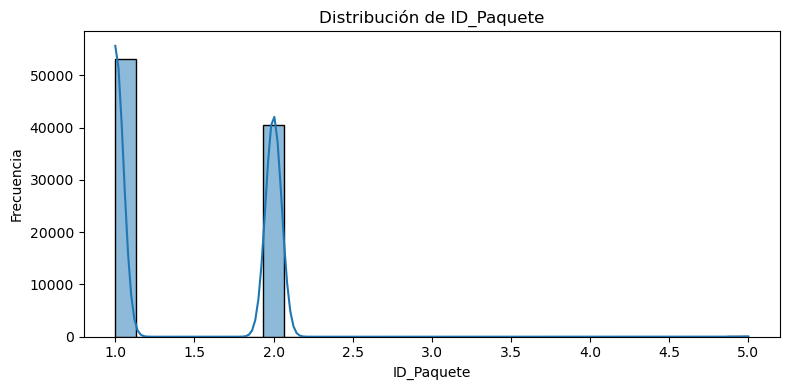

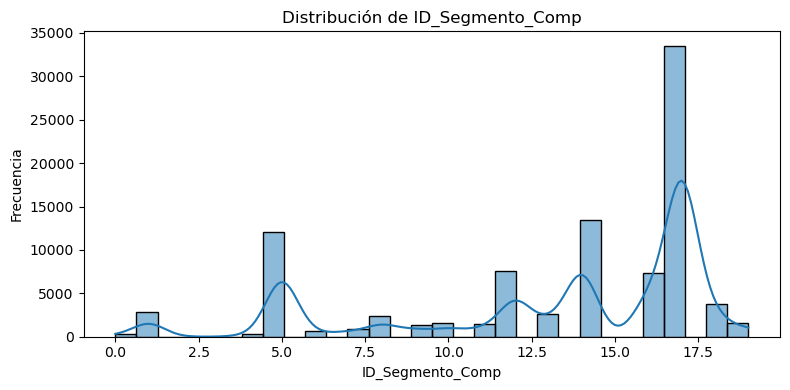

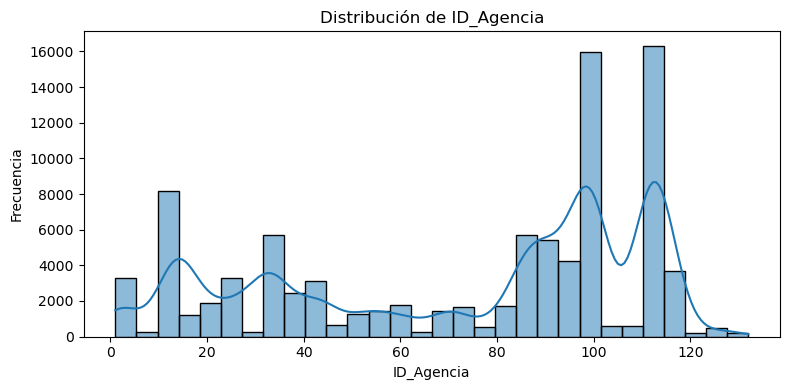

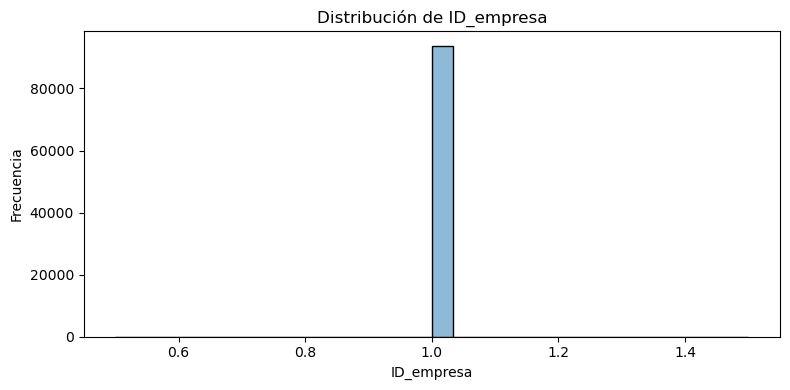

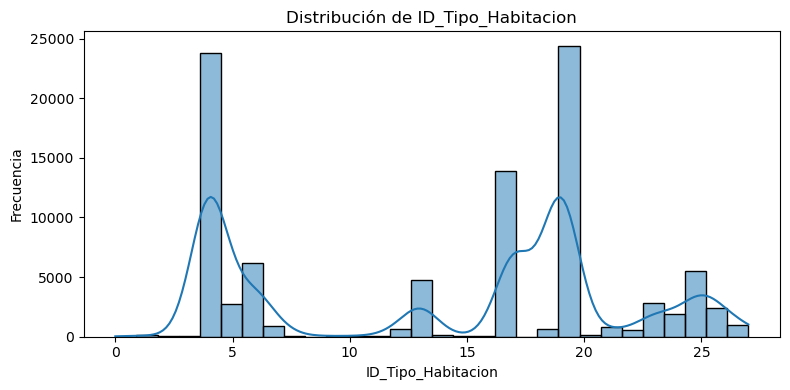

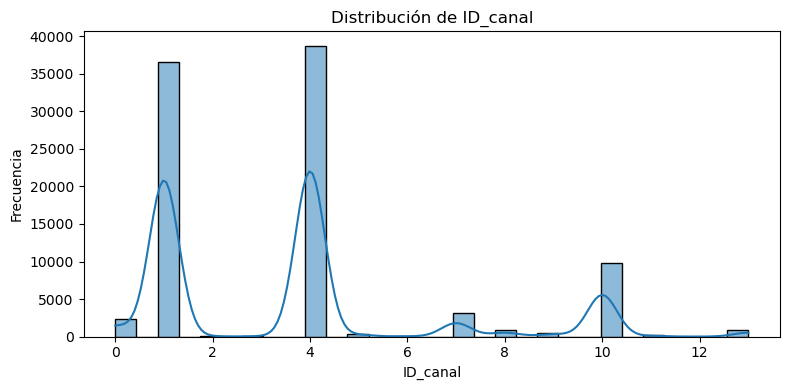

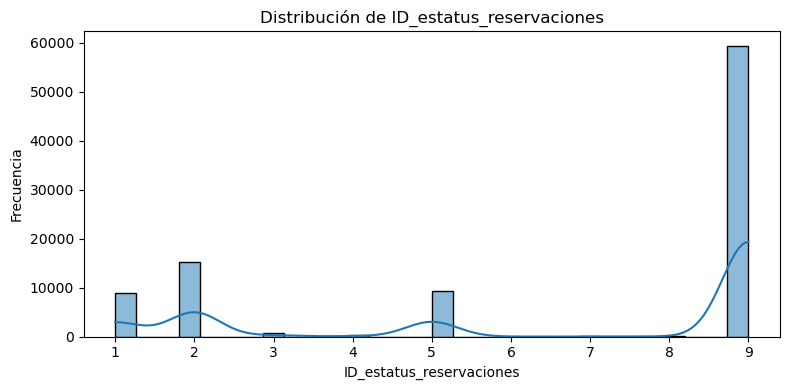

In [34]:
for col in columns_with_id:
    plt.figure(figsize=(8, 4))
    sns.histplot(df_unido[col].dropna(), kde=True, bins=30)
    plt.title(f'Distribución de {col}')
    plt.xlabel(col)
    plt.ylabel('Frecuencia')
    plt.tight_layout()
    plt.show()

In [35]:
date_columns

Index(['h_fec_lld_ok', 'h_fec_sda_ok'], dtype='object')

In [36]:
for col in date_columns:
    df_unido[col] = pd.to_datetime(df_unido[col], errors='coerce')

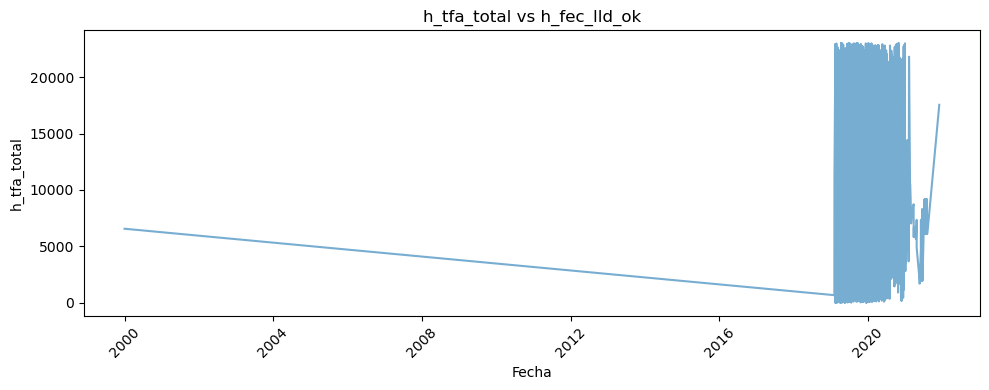

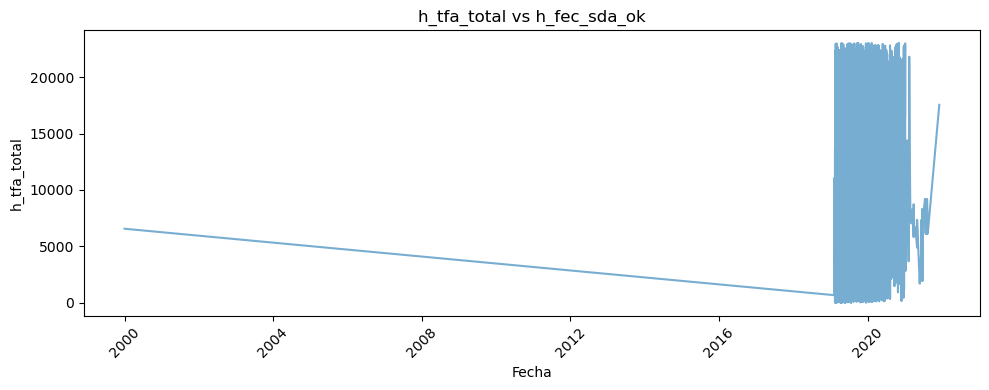

In [37]:
target_col = 'h_tfa_total'
for col in date_columns:
    df_sorted = df_unido.sort_values(col)
    plt.figure(figsize=(10, 4))
    plt.plot(df_sorted[col], df_sorted[target_col], linestyle='-', alpha=0.6)
    plt.title(f'{target_col} vs {col}')
    plt.xlabel('Fecha')
    plt.ylabel(target_col)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

In [38]:
for col in date_columns:
    df_sorted = df_unido.sort_values(col)
    fig = px.line(df_sorted, x=col, y=target_col, title=f'{target_col} vs {col}')
    fig.update_layout(xaxis_title='Fecha', yaxis_title=target_col)
    fig.show()

In [39]:
df_fil = df_unido[(df_unido['h_fec_lld_ok'] >= '2019-01-01') &(df_unido['h_fec_sda_ok'] >= '2019-01-01')&
                  (df_unido['h_fec_lld_ok'] <= '2021-01-01') &(df_unido['h_fec_sda_ok'] <= '2021-01-01')
                  ]


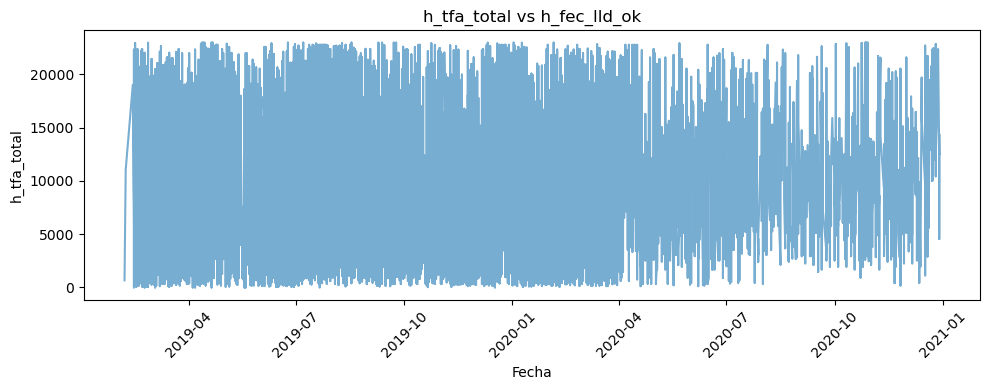

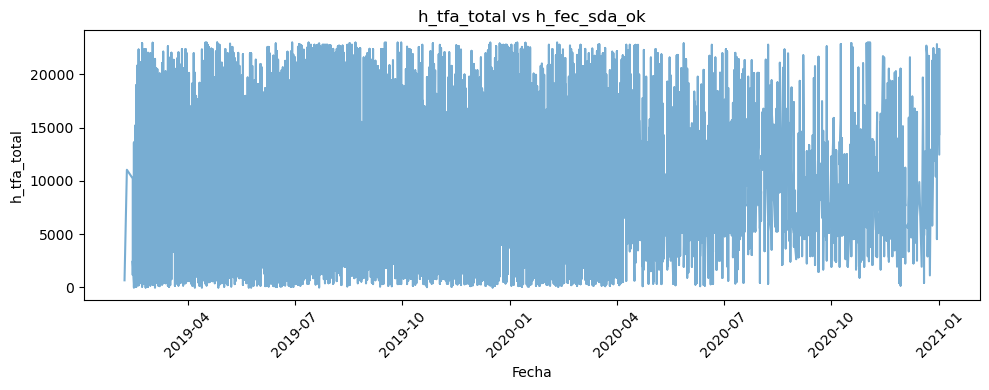

In [40]:
target_col = 'h_tfa_total'
for col in date_columns:
    df_sorted = df_fil.sort_values(col)
    plt.figure(figsize=(10, 4))
    plt.plot(df_sorted[col], df_sorted[target_col], linestyle='-', alpha=0.6)
    plt.title(f'{target_col} vs {col}')
    plt.xlabel('Fecha')
    plt.ylabel(target_col)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

In [ ]:
df_unido.describe()

,h_num_per,h_num_adu,h_num_men,h_num_noc,h_tot_hab,ID_Paquete,ID_Segmento_Comp,ID_Agencia,ID_empresa,ID_Tipo_Habitacion,ID_canal,Cliente_Disp,Reservacion,ID_estatus_reservaciones,h_can_res,h_cod_reserva,h_edo,h_codigop,h_tfa_total
count,93716.000000,93716.000000,93716.000000,93716.000000,93716.000000,93716.000000,93716.000000,93716.000000,93716.0,93716.000000,93716.000000,93716.000000,93716.0,93716.000000,93716.000000,93716.000000,93716.000000,93716.000000,93716.000000
mean,2.357356,2.176960,0.068046,3.189669,1.007235,1.433800,13.183971,72.942774,1.0,13.938687,3.620502,2.176960,1.0,6.652887,2.979630,25904.082803,64.165863,2867.985499,8114.256845
std,1.006399,0.756944,0.375489,1.471418,0.108788,0.501976,4.840380,37.448120,0.0,7.665719,3.000038,0.756944,0.0,3.225668,3.361342,8944.331770,22.890304,3072.555670,4478.025839
min,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,1.0,0.000000,0.000000,1.000000,1.0,1.000000,0.000000,0.000000,0.000000,0.000000,0.080000
25%,2.000000,2.000000,0.000000,2.000000,1.000000,1.000000,11.000000,33.000000,1.0,4.000000,1.000000,2.000000,1.0,2.000000,0.000000,23428.750000,52.000000,0.000000,5252.000000
50%,2.000000,2.000000,0.000000,3.000000,1.000000,1.000000,14.000000,89.000000,1.0,17.000000,4.000000,2.000000,1.0,9.000000,3.000000,31047.000000,54.000000,1268.500000,7662.000000
75%,2.000000,2.000000,0.000000,4.000000,1.000000,2.000000,17.000000,101.000000,1.0,19.000000,4.000000,2.000000,1.0,9.000000,3.000000,31047.000000,75.000000,6039.000000,10636.960000
max,32.000000,15.000000,15.000000,8.000000,6.000000,5.000000,19.000000,132.000000,1.0,27.000000,13.000000,15.000000,1.0,9.000000,13.000000,31047.000000,140.000000,10093.000000,22993.950000


In [43]:
df_fil.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 93267 entries, 0 to 93715
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   h_num_per                 93267 non-null  int64         
 1   h_num_adu                 93267 non-null  int64         
 2   h_num_men                 93267 non-null  int64         
 3   h_num_noc                 93267 non-null  int64         
 4   h_tot_hab                 93267 non-null  int64         
 5   ID_Paquete                93267 non-null  int64         
 6   ID_Segmento_Comp          93267 non-null  int64         
 7   ID_Agencia                93267 non-null  int64         
 8   ID_empresa                93267 non-null  int64         
 9   ID_Tipo_Habitacion        93267 non-null  int64         
 10  ID_canal                  93267 non-null  int64         
 11  h_fec_lld_ok              93267 non-null  datetime64[ns]
 12  h_fec_sda_ok      

Text(0.5, 1.0, 'Correlacion')

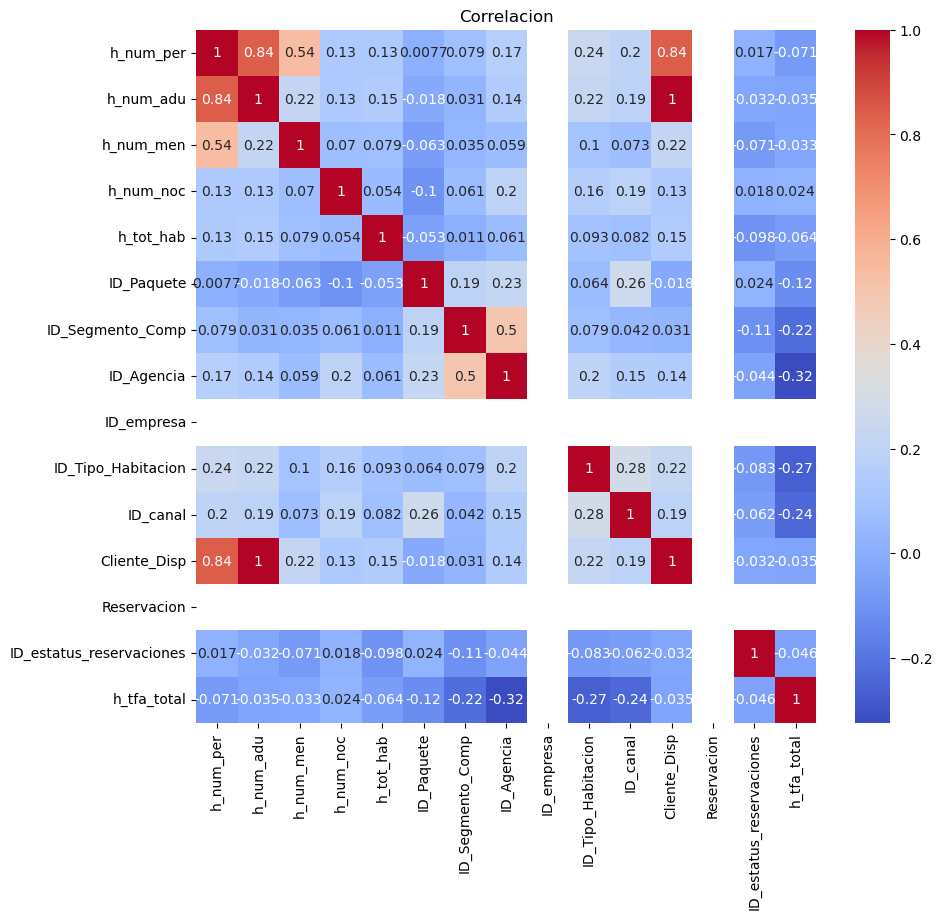

In [44]:
numeric_data=df_fil.select_dtypes(include=["int64","float64"])
plt.figure(figsize=(10,9))
sns.heatmap(numeric_data.corr(),annot=True,cmap='coolwarm')
plt.title("Correlacion")

In [ ]:
# Guardar la base de datos
df_fil.to_csv("reservaciones_clean.csv",index=False)